# Hydrodynamical code 

### Notes
* I want to try using upwind/downwind and compare the result with Lax
* There are parameters in the evolve functions that I no longer use.  
____________

### Questions/problems: 
* The dt seems to be too large, causing instabilites.
    * This is fixed by using cfl_cut = 0.48
    * I have not tried to do a von Neumann analysis yet.
* Riemann solver becomes unstable


____________
### What I have tried so far: 
* Approximated the initial conditions for the pressure and the density using a hyperbolic function
* Make the Lax method more diffusive 
* Set the boundaries in the evolve functions to be the right step for the leftmost boundary and the left step for the rightmost boundary 
* Used $u+u_{\text sound}$ as the $v_a$ in the Riemann solver
* Fixed the equation of state. 
* Using cfl_cut = 0.48 to make the solution stable
    * If I use 0.98, the solution becomes a lot more unstable, and the timesteps are varying a lot more as well. 
* I use $\gamma$ in the sound speed.




_____________


In [195]:
import numpy as np 
import matplotlib.pyplot as plt 
from nm_lib import nm_lib as nm
from matplotlib.animation import FuncAnimation
from IPython.display import HTML

### R.h.s of Euler's equations and making step functions

I rewrite the equations with the assumption of 1 dimension

We want to solve the hydrodynamic equations:

$$\tag{1}
\frac{\partial \rho}{\partial t} + \nabla \cdot (\rho \bf u) = 0 
$$

$$\tag{2}
\frac{\partial \rho {\bf u}}{\partial t} + \nabla \cdot (\rho {\bf u} \otimes {\bf u}) = - \nabla (P_g)
$$

$$\tag{3}
\frac{\partial e}{\partial t } = -\nabla\cdot e {\bf u} -P_g \nabla \cdot {\bf u}
$$



We start by doing this in one dimension, 1D, similarly to what we have done so far with the other differential equations in the exercises. 


Let us start with the **continuity equation** in eq.(1). In 1D, this can be written as 

$$
\frac{\partial \rho}{\partial t} + \frac{\partial \rho u}{\partial x},
$$

giving us the right-hand-side: 

$$
\frac{\partial \rho}{\partial t} =-  \frac{\partial \rho u}{\partial x}.
$$

With the r.h.s having only one term, I write the Flux as: $F_{\rho} = \rho u$.



The step function below returns the r.h.s of the continuity equation.

In [196]:
def step_cont_1D(xx, rho, u, axis, cfl_cut = 0.98, 
                    ddx = lambda x,y: nm.deriv_cent(x, y), bnd_limits=[1,1]): 
   
    rhs = -ddx(xx,rho*u,axis=axis) 
    return rhs

The momentum equation, eq.2, can in 1D be rewritten as

$$
\frac{\partial \rho u}{\partial t} = - \frac{\partial \rho u^2}{\partial x} - \frac{\partial Pg}{\partial x}.
$$

Here, I write the flux as $F_{\text mom} = \rho u^2 + P_g$. 


In 1D, the energy equation can be written as:

$$
\frac{\partial e}{\partial t} = -\frac{\partial e u}{\partial x} - P_g\frac{\partial u}{\partial x},
$$

with the flux being $F_{e} = u(e+P_g)$. 

The step functions returning the r.h.s of the momentum and energy equations are implemented below. 


In [197]:
def step_mom_1D(xx, rho, u, Pg, cfl_cut = 0.98, 
                    ddx1 = lambda x,y: nm.deriv_cent(x, y), ddx2 = lambda x,y: nm.deriv_cent(x, y), bnd_limits=[1,1]): 

    # rhs = -ddx1(xx,rho*u**2) - ddx2(xx, Pg)
    rhs = -ddx1(xx, rho*u**2 + Pg)

    return rhs

In [198]:
def step_e_1D(xx, e, u, Pg, cfl_cut = 0.98, 
                    ddx1 = lambda x,y: nm.deriv_cent(x, y), ddx2 = lambda x,y: nm.deriv_cent(x, y), bnd_limits=[1,1]): 

    # rhs = -ddx1(xx,e*u) - Pg*ddx2(xx, u)
    rhs = -ddx1(xx, u*(e+Pg))

    return rhs

Now comes the evolve function. This one is without trying to use Riemann solvers, only the Lax method. As for now it used the more diffusive Lax method, but the less diffusive method we used in some exercises is commented out right above. 

My main goal with this evolve function is to evolve the three equations in time all at once, since they depend on each other. Here I also evolve the time using a computed time step, based on a comparison between $u$ and $u_{\text sound}$.

The pressure is updated using the extra energy-pressure relation: $P_g = (\gamma -1)e \rho$, with $\gamma = 5/3$. The velocity $u$ is found by assuming $u = \text{momentum}/\rho$. 

In [199]:
def evolv_Euler(xx, rho, u, energy, Pg, nt, cfl_cut = 0.98, 
        ddx = lambda x,y: nm.deriv_cent(x, y),
        bnd_type='wrap', bnd_limits=[1,0], axis = 0, **kwargs):
    
    gamma = 1.4

    t = np.zeros(nt)
    # un = np.zeros((len(xx), nt))
    # un[:,0] = hh
    # d = len(un)

    rho_new = np.zeros((len(xx), 1, 1, nt))
    mom_new = np.zeros((len(xx), 1, 1, nt))
    e_new = np.zeros((len(xx), 1, 1, nt)) 

    rho_new[:,:,:,0] = rho
    mom_new[:,:,:,0] = rho*u
    e_new[:,:,:,0] = energy

    d = len(rho_new)
    dx = xx[1]-xx[0]

    for i in range(nt-1): 
        rhs_cont = step_cont_1D(xx, rho_new[:,:,:,i], u, axis = axis, cfl_cut = cfl_cut ,ddx = ddx)
        rhs_mom = step_mom_1D(xx, rho_new[:,:,:,i], u, Pg, cfl_cut=cfl_cut, ddx1 = ddx, ddx2=ddx)
        rhs_e = step_e_1D(xx, e_new[:,:,:,i], u, Pg, cfl_cut=cfl_cut, ddx1=ddx, ddx2=ddx)

        #Finding smallest time step
        dt1 = np.min(np.abs(dx/u))

        u_sound = np.sqrt(gamma*Pg/rho_new[:,:,:,i])
        # u_sound = np.sqrt(Pg/rho_new[:,:,:,i])

        dt2 = np.min(np.abs(dx/u_sound))

        u_tot = u_sound + u

        dt = cfl_cut*min(dt1,dt2)
        print(dt)

        # dt = 0.0002

        #Using Lax method to evolve the three parameters    
        # Old lax method
        # rho_new[:,:,:, i+1] = 0.5*(np.roll(rho_new[:,:,:,i], -1) + np.roll(rho_new[:,:,:,i], 1)) + rhs_cont*dt
        # mom_new[:,:,:, i+1] = 0.5*(np.roll(mom_new[:,:,:,i], -1) + np.roll(mom_new[:,:,:,i], 1)) + rhs_mom*dt
        # e_new[:,:,:, i+1] = 0.5*(np.roll(e_new[:,:,:,i], -1) + np.roll(e_new[:,:,:,i], 1)) + rhs_e*dt

        # More diffusive Lax method:
        rho_new[:,:,:, i+1] = (1/3)*(np.roll(rho_new[:,:,:,i], -1) + rho_new[:,:,:,i] + np.roll(rho_new[:,:,:,i], 1)) + rhs_cont*dt
        mom_new[:,:,:, i+1] = (1/3)*(np.roll(mom_new[:,:,:,i], -1) + mom_new[:,:,:,i] + np.roll(mom_new[:,:,:,i], 1)) + rhs_mom*dt
        e_new[:,:,:, i+1] = (1/3)*(np.roll(e_new[:,:,:,i], -1) + e_new[:,:,:,i] + np.roll(e_new[:,:,:,i], 1)) + rhs_e*dt

        t[i+1] = t[i]+dt

        
        # Boundaries: 
        rho_new[0,0,0,i+1] = rho_new[1,0,0,i+1]
        rho_new[-1,0,0,i+1] = rho_new[-2,0,0,i+1]

        mom_new[0,0,0,i+1] = mom_new[1,0,0,i+1]
        mom_new[-1,0,0,i+1] = mom_new[-2,0,0,i+1]

        e_new[0,0,0,i+1] = e_new[1,0,0,i+1]
        e_new[-1,0,0,i+1] = e_new[-2,0,0,i+1]

        u = mom_new[:,:,:,i+1]/rho_new[:,:,:,i+1]
        Pg = (gamma-1)*e_new[:,:,:,i+1]*rho_new[:,:,:,i+1]

    return t, rho_new, mom_new, e_new 

### Initial conditions 

To compare to the analytical solutions (not implemented in the code yet) I used the initial conditions from: https://en.wikipedia.org/wiki/Sod_shock_tube
This way I could compare my plot to the plot in Wikipedia.
I will change back to the initial conditions from the project description.

In [216]:
gamma = 1.4
x = np.linspace(0,1,1024)

idx = int(len(x)/2)
print(idx)

rho_L = 1
rho_R = 0.125
Pg_L = 1
Pg_R = 0.1

rho_0 = np.zeros((len(x), 1, 1))
Pg_0 = np.zeros((len(x), 1, 1))

rho_0[:idx,0,0] = rho_L
rho_0[idx:,0,0] = rho_R

Pg_0[:idx,0,0] = Pg_L
Pg_0[idx:,0,0] = Pg_R


512


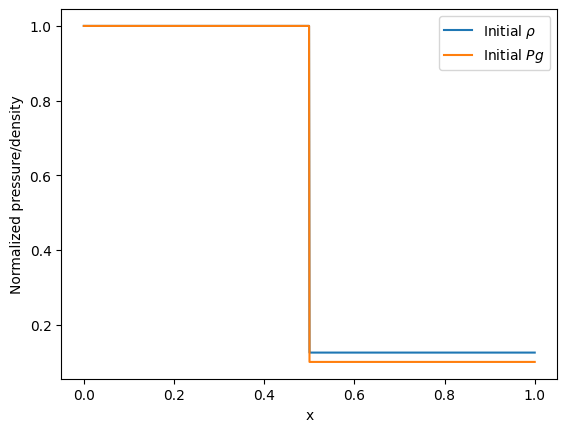

In [217]:
plt.plot(x,rho_0[:,0,0], label=r"Initial $\rho$")
plt.plot(x,Pg_0[:,0,0], label=r"Initial $Pg$")
plt.xlabel("x")
plt.ylabel("Normalized pressure/density")
plt.legend()
plt.show()

### Implement hyperbolic curve fitting

In order to make the initial conditions more continuous, I fit them using a hyperbolic function; $\tanh$. 

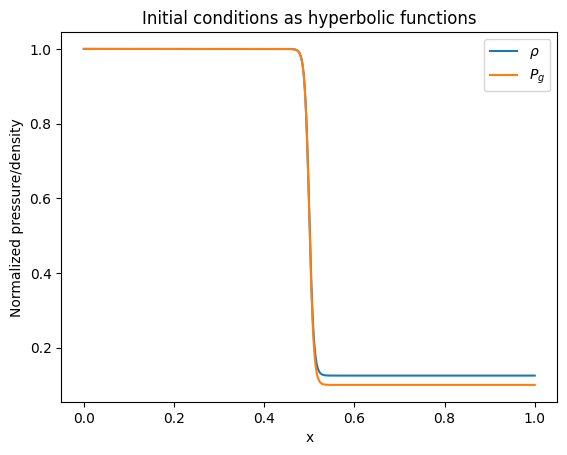

In [218]:
def f(xx, a, b,c,d): 
    return a*np.tanh(c+b*xx) + d

new_ic_rho = np.zeros((len(x), 1, 1))
new_ic_Pg = np.zeros((len(x), 1, 1))

new_ic_rho[:,0,0] = f(x, (rho_R-rho_L)/2, 100,-50, (rho_R+rho_L)/2)
new_ic_Pg[:,0,0]= f(x, (Pg_R-Pg_L)/2, 100, -50, (Pg_R+Pg_L)/2)


plt.plot(x,new_ic_rho[:,0,0], label=r"$\rho$")
plt.plot(x, new_ic_Pg[:,0,0], label=r"$P_g$")
plt.title("Initial conditions as hyperbolic functions")
plt.xlabel("x")
plt.ylabel("Normalized pressure/density")
plt.legend()
plt.show()


In [203]:
plt.close()

The initial velocity $u$ is zero. Using the equation of state, 

$$
e = \frac{P_g}{(\gamma -1)\rho},
$$
we can compute the initial energy.

In [204]:
nt = 1000

u = np.zeros((len(x),1,1))
e0 = new_ic_Pg/(new_ic_rho*(gamma-1))


t, rho_new, mom_new, e_new = evolv_Euler(x, new_ic_rho, u, e0, new_ic_Pg, nt, cfl_cut = 0.48, 
        ddx = nm.deriv_cent,
        bnd_type='wrap', bnd_limits=[0,0], axis=0)

C:\Users\eier\AppData\Local\Temp\ipykernel_19932\54124323.py:29: RuntimeWarning: divide by zero encountered in divide
  dt1 = np.min(np.abs(dx/u))


0.00039655331600165
0.00039655331600164993
0.00039655331600164993
0.00039655331600164993
0.00039655331600164993
0.00039655331600164993
0.00039655331600165
0.00039655331600164993
0.00039655331600164993
0.00039655331600165
0.00039655331600165
0.00039655331600165
0.00039655331600165
0.00039655331600165
0.00039655331600165
0.00039655331600165
0.00039655331600165
0.0003957346171212016
0.00039352146313740053
0.0003913168213630253
0.0003889237173732222
0.0003866879417576422
0.000384281174555981
0.00038199937414031937
0.00037971653549997845
0.0003774326334713342
0.0003753261616933028
0.0003730703630788319
0.0003711230039137203
0.000368975114051406
0.00036708089555490746
0.0003651908761778675
0.0003633555401814567
0.0003617427780272433
0.0003599711311759746
0.00035849749655236796
0.00035693745240224716
0.00035551427129599215
0.00035424878848038535
0.00035288145371526646
0.00035176232809179585
0.0003505821463394226
0.0003495037120426706
0.0003485870870134103
0.0003475596518491628
0.0003467207933

In [205]:
plt.ioff()

M = 10

fig, axes = plt.subplots(nrows=1, ncols=1, figsize=(10, 5))

def init(): 
    axes.plot(x,rho_new[:,0,0,0])

def animate(i):
 
    axes.clear()
    axes.plot(x,rho_new[:,:,:,::M][:,0,0,i])
    axes.set_title('Density, t=%.12f'%t[::M][i])
    axes.set_xlabel("x")
    axes.set_ylabel("u_i")
    axes.grid()
    
    
anim = FuncAnimation(fig, animate, interval=50, frames=len(t[::M]), init_func=init)
HTML(anim.to_jshtml())

In [206]:
plt.close()

In [207]:
plt.ioff()

M = 10

fig, axes = plt.subplots(nrows=1, ncols=1, figsize=(10, 5))

def init(): 
    axes.plot(x,mom_new[:,0,0,0])

def animate(i):
 
    axes.clear()
    axes.plot(x,mom_new[:,:,:,::M][:,0,0,i])
    axes.set_title('Momentum, t=%.6f'%t[::M][i])
    axes.set_xlabel("x")
    axes.set_ylabel("u_i")
    axes.grid()
    
    
anim = FuncAnimation(fig, animate, interval=50, frames=len(t[::M]), init_func=init)
HTML(anim.to_jshtml())

In [208]:
plt.close()

In [209]:
plt.ioff()

M = 10

fig, axes = plt.subplots(nrows=1, ncols=1, figsize=(10, 5))

def init(): 
    axes.plot(x,e_new[:,0,0,0])

def animate(i):
 
    axes.clear()
    axes.plot(x,e_new[:,:,:,::M][:,0,0,i])
    axes.set_title('Energy, t=%.6f'%t[::M][i])
    axes.set_xlabel("x")
    axes.set_ylabel("u_i")
    axes.grid()
    
    
anim = FuncAnimation(fig, animate, interval=50, frames=len(t[::M]), init_func=init)
HTML(anim.to_jshtml())

In [210]:
plt.close()

### Implementing Riemann solver in 1D case



In [211]:
def evolv_Rie_Euler(xx, rho, u, energy, Pg, nt, cfl_cut = 0.98,
        bnd_type='wrap', bnd_limits=[1,1], axis = 0, **kwargs):
    
    gamma = 5/3

    t = np.zeros(nt)

    rho_new = np.zeros((len(xx), 1, 1, nt))
    mom_new = np.zeros((len(xx), 1, 1, nt))
    e_new = np.zeros((len(xx), 1, 1, nt)) 

    rho_new[:,:,:,0] = rho
    mom_new[:,:,:,0] = rho*u
    e_new[:,:,:,0] = energy

    d = len(rho_new)
    dx = xx[1]-xx[0]

    
    for i in range(nt-1): 

        # Computing left and right
        rho_L = rho_new[:,:,:,i]
        rho_R = np.roll(rho_new[:,:,:,i],-1)

        mom_L = mom_new[:,:,:,i]
        mom_R = np.roll(mom_new[:,:,:,i],-1)

        e_L = e_new[:,:,:,i]
        e_R = np.roll(e_new[:,:,:,i],-1)

        # Defining the flux
        F_rho_L = rho_L*u
        F_rho_R = rho_R*u

        F_mom_L = (rho_L*u**2 + Pg)
        F_mom_R = (rho_R*u**2 + Pg)

        F_e_L = u*(e_L + Pg)
        F_e_R = u*(e_R + Pg)

        # print(F_rho_L.shape)


        # Computing the dt, and choosing the smallest one??
        dt1 = cfl_cut*np.min(np.abs(dx/u))
        
        u_sound = np.sqrt(gamma*Pg/rho_new[:,:,:,i])
        dt2 = cfl_cut*np.min(np.abs(dx/u_sound))

        # dt = cfl_cut*min(dt1,dt2)


        # va_rho = np.zeros(np.shape(rho_new[:,:,:,0]))
        # for j in range(len(va_rho)): 
        #     va_rho[j,:,:] = np.max(np.array([np.abs(rho_R[j]), np.abs(rho_L[j])]))

        # va_mom = np.zeros(np.shape(mom_new[:,:,:,0]))
        # for j in range(len(va_mom)): 
        #     va_mom[j,:,:] = np.max(np.array([np.abs(mom_R[j]), np.abs(mom_L[j])]))

        # va_e = np.zeros(np.shape(e_new[:,:,:,0]))
        # for j in range(len(va_e)): 
        #     va_e[j,:,:] = np.max(np.array([np.abs(e_R[j]), np.abs(e_L[j])]))

        va_rho = np.abs(u)+u_sound
        va_mom = np.abs(u)+u_sound
        va_e = np.abs(u)+u_sound

        dt3_rho = cfl_cut*np.min(dx/np.abs(va_rho)) 
        dt3_mom = cfl_cut*np.min(dx/np.abs(va_mom))
        dt3_e = cfl_cut*np.min(dx/np.abs(va_e))


        # dt = cfl_cut*np.min(np.abs(dx/va_e))
        
        dt = min(dt1, dt2, dt3_e)
        # dt = 0.0004

        # Computing the r.h.s
        # rhs_rho = ((F_rho_R + F_rho_L)/2 - u/2*(rho_R - rho_L))/dx
        # rhs_mom = ((F_mom_R + F_mom_L)/2 - u/2*(mom_R - mom_L))/dx
        # rhs_e = ((F_e_R + F_e_L)/2 - u/2*(e_R - e_L))/dx

        # print(rhs_rho.shape)

        rhs_rho = ((F_rho_R + F_rho_L)/2 - va_rho/2*(rho_R - rho_L))/dx
        rhs_mom = ((F_mom_R + F_mom_L)/2 - va_mom/2*(mom_R - mom_L))/dx
        rhs_e = ((F_e_R + F_e_L)/2 - va_e/2*(e_R - e_L))/dx    

        # Evloving the parameters in time
        rho_new[:,:,:,i+1] = rho_new[:,:,:,i] - dt*(rhs_rho - np.roll(rhs_rho,1))
        mom_new[:,:,:,i+1] = mom_new[:,:,:,i] - dt*(rhs_mom - np.roll(rhs_mom,1))
        e_new[:,:,:,i+1] = e_new[:,:,:,i] - dt*(rhs_e - np.roll(rhs_e,1))


        # rho_new[:,:,:,i+1] = np.pad(rho_new[bnd_limits[0]:d- bnd_limits[1],:,:,i+1], bnd_limits, bnd_type)
        
        # if axis==0:
        #     rho_new[:,0,0,i+1] = np.pad(rho_new[bnd_limits[0]:d- bnd_limits[1],0,0,i+1], bnd_limits, bnd_type)
        #     mom_new[:,0,0,i+1] = np.pad(mom_new[bnd_limits[0]:d- bnd_limits[1],0,0,i+1], bnd_limits, bnd_type)
        #     e_new[:,0,0,i+1] = np.pad(e_new[bnd_limits[0]:d- bnd_limits[1],0,0,i+1], bnd_limits, bnd_type)

        rho_new[0,0,0,i+1] = rho_new[1,0,0,i+1]
        rho_new[-1,0,0,i+1] = rho_new[-2,0,0,i+1]

        mom_new[0,0,0,i+1] = mom_new[1,0,0,i+1]
        mom_new[-1,0,0,i+1] = mom_new[-2,0,0,i+1]

        e_new[0,0,0,i+1] = e_new[1,0,0,i+1]
        e_new[-1,0,0,i+1] = e_new[-2,0,0,i+1]


        # Updating the time
        t[i+1] = t[i]+dt

        # Updating the velocity and the pressure
        u = mom_new[:,:,:,i+1]/rho_new[:,:,:,i+1]
        Pg = (gamma-1)*e_new[:,:,:,i+1]*rho_new[:,:,:,i+1]


    return t, rho_new, mom_new, e_new

    

In [212]:
t_R, rho_new_R, mom_new_R, e_new_R = evolv_Rie_Euler(x, new_ic_rho, u, e0, new_ic_Pg, nt, cfl_cut = 0.48,
        bnd_type='wrap', bnd_limits=[1,1], axis=0)

C:\Users\eier\AppData\Local\Temp\ipykernel_19932\2832635084.py:46: RuntimeWarning: divide by zero encountered in divide
  dt1 = cfl_cut*np.min(np.abs(dx/u))
C:\Users\eier\AppData\Local\Temp\ipykernel_19932\2832635084.py:48: RuntimeWarning: invalid value encountered in sqrt
  u_sound = np.sqrt(gamma*Pg/rho_new[:,:,:,i])


In [213]:
plt.ioff()

M = 10

fig, axes = plt.subplots(nrows=1, ncols=1, figsize=(10, 5))

def init(): 
    axes.plot(x,rho_new_R[:,0,0,0])

def animate(i):
 
    axes.clear()
    axes.plot(x,rho_new_R[:,:,:,::M][:,0,0,i])
    axes.set_title('Density, t=%.11f'%t_R[::M][i])
    axes.set_xlabel("x")
    axes.set_ylabel("u_i")
    axes.grid()
    
    
anim = FuncAnimation(fig, animate, interval=50, frames=len(t_R[::M]), init_func=init)
HTML(anim.to_jshtml())